<a href="https://colab.research.google.com/github/Keita062/soccer/blob/main/(10_29)second.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# 読み込むCSVファイルのパスをリスト化
file_paths = [
    "/content/1992.csv", "/content/1993.csv", "/content/1994.csv", "/content/1995.csv",
    "/content/1996.csv", "/content/1997.csv", "/content/1998.csv", "/content/1999.csv",
    "/content/2000.csv", "/content/2001.csv", "/content/2002.csv", "/content/2003.csv",
    "/content/2004.csv", "/content/2005.csv", "/content/2006.csv", "/content/2007.csv",
    "/content/2008.csv", "/content/2009.csv", "/content/2010.csv", "/content/2011.csv",
    "/content/2012.csv", "/content/2013.csv", "/content/2014.csv", "/content/2015.csv",
    "/content/2017.csv", "/content/2018.csv", "/content/2019.csv", "/content/2020.csv"
]

# 各CSVファイルをDataFrameとして読み込み、リストに格納
data_frames = [pd.read_csv(file) for file in file_paths]

# すべてのDataFrameを縦方向に結合
total_premia_data  = pd.concat(data_frames, ignore_index=True)

# 元のチーム名の配列
teams = np.array([
    'Manchester United FC', 'Arsenal FC', 'Chelsea FC', 'Liverpool FC',
    'Tottenham Hotspur FC', 'Everton FC', 'Manchester City FC',
    'Newcastle United FC', 'Aston Villa FC', 'West Ham United FC',
    'Blackburn Rovers FC', 'Southampton FC', 'Leeds United FC',
    'Middlesbrough FC', 'Leicester City FC', 'Fulham FC',
    'Sunderland AFC', 'Bolton Wanderers FC', 'Crystal Palace FC',
    'West Bromwich Albion FC', 'Stoke City FC', 'Coventry City FC',
    'Sheffield Wednesday FC', 'Wimbledon FC', 'Norwich City FC',
    'Charlton Athletic FC', 'Wigan Athletic FC',
    'Queens Park Rangers FC', 'Portsmouth FC', 'Birmingham City FC',
    'Derby County FC', 'Swansea City FC', 'Wolverhampton Wanderers FC',
    'Nottingham Forest FC', 'Ipswich Town FC', 'Watford FC',
    'Burnley FC', 'Sheffield United FC', 'AFC Bournemouth',
    'Hull City AFC', 'Reading FC', 'Brighton & Hove Albion FC',
    'Oldham Athletic AFC', 'Cardiff City FC', 'Bradford City AFC',
    'Huddersfield Town AFC', 'Blackpool FC', 'Tottenham', 'West Brom',
    'West Ham', 'Southampton', 'Liverpool', 'Sheffield Utd',
    'Newcastle Utd', 'Aston Villa', 'Brighton', 'Burnley', 'Chelsea',
    'Crystal Palace', 'Everton', 'Fulham', 'Leeds United',
    'Leicester City', 'Arsenal', 'Manchester City', 'Manchester Utd',
    'Wolves', 'Barnsley FC', 'Swindon Town FC'
])

# チーム名の標準化を行う辞書
team_name_mapping = {
    'Manchester United FC': 'Manchester United',
    'Manchester Utd': 'Manchester United',
    'Arsenal FC': 'Arsenal',
    'Arsenal': 'Arsenal',
    'Chelsea FC': 'Chelsea',
    'Chelsea': 'Chelsea',
    'Liverpool FC': 'Liverpool',
    'Liverpool': 'Liverpool',
    'Tottenham Hotspur FC': 'Tottenham Hotspur',
    'Tottenham': 'Tottenham Hotspur',
    'Everton FC': 'Everton',
    'Everton': 'Everton',
    'Manchester City FC': 'Manchester City',
    'Manchester City': 'Manchester City',
    'Newcastle United FC': 'Newcastle United',
    'Newcastle Utd': 'Newcastle United',
    'Aston Villa FC': 'Aston Villa',
    'Aston Villa': 'Aston Villa',
    'West Ham United FC': 'West Ham United',
    'West Ham': 'West Ham United',
    'Southampton FC': 'Southampton',
    'Southampton': 'Southampton',
    'Fulham FC': 'Fulham',
    'Fulham': 'Fulham',
    'Leeds United FC': 'Leeds United',
    'Leeds United': 'Leeds United',
    'Leicester City FC': 'Leicester City',
    'Leicester City': 'Leicester City',
    'Brighton & Hove Albion FC': 'Brighton',
    'Brighton': 'Brighton',
    'Burnley FC': 'Burnley',
    'Burnley': 'Burnley',
    'Wolverhampton Wanderers FC': 'Wolves',
    'Wolves': 'Wolves',
    # 追加のチーム名のマッピングをここに追加できます
}

# チーム名を標準化する
standardized_teams = np.array([team_name_mapping.get(team, team) for team in teams])

total_premia_data['Team 1'] = total_premia_data['Team 1'].map(team_name_mapping).fillna(total_premia_data['Team 1'])
total_premia_data['Team 2'] = total_premia_data['Team 2'].map(team_name_mapping).fillna(total_premia_data['Team 2'])

# Date列を曜日, 月, 日, 年に分割 (例: 'Sat Oct 14 2020')
total_premia_data[['Weekday', 'Month', 'Day', 'Year']] = total_premia_data['Date'].str.split(' ', expand=True)

# Day列を整数型に変換
total_premia_data['Day'] = pd.to_numeric(total_premia_data['Day'], errors='coerce')

In [ ]:
total_premia_data['FT'] = total_premia_data['FT'].str.replace('–', '-', regex=False)
# スコア列を分割 (例: '2-4' → 'Team1_Score' と 'Team2_Score')
total_premia_data[['Team1_Score', 'Team2_Score']] = total_premia_data['FT'].str.split('-', expand=True)

# スコア列を整数型に変換
total_premia_data['Team1_Score'] = pd.to_numeric(total_premia_data['Team1_Score'], errors='coerce')
total_premia_data['Team2_Score'] = pd.to_numeric(total_premia_data['Team2_Score'], errors='coerce')

In [ ]:
total_premia_data['Date_Formatted'] = pd.to_datetime(
    total_premia_data[['Year', 'Month', 'Day']].astype(str).agg('-'.join, axis=1), errors='coerce'
)
total_premia_data.head()

,Round,Date,Team 1,FT,Team 2,Weekday,Month,Day,Year,Team1_Score,Team2_Score,Date_Formatted
0,1,Sat Aug 15 1992,Arsenal,2-4,Norwich City FC,Sat,Aug,15,1992,2,4,1992-08-15
1,1,Sat Aug 15 1992,Leeds United,2-1,Wimbledon FC,Sat,Aug,15,1992,2,1,1992-08-15
2,1,Sat Aug 15 1992,Coventry City FC,2-1,Middlesbrough FC,Sat,Aug,15,1992,2,1,1992-08-15
3,1,Sat Aug 15 1992,Ipswich Town FC,1-1,Aston Villa,Sat,Aug,15,1992,1,1,1992-08-15
4,1,Sat Aug 15 1992,Crystal Palace FC,3-3,Blackburn Rovers FC,Sat,Aug,15,1992,3,3,1992-08-15


In [ ]:
total_premia_data.isna().sum() # 欠損値の確認

,0
Round,0
Date,0
Team 1,0
FT,0
Team 2,0
Weekday,0
Month,0
Day,0
Year,0
Team1_Score,0


In [ ]:
# スコアのカラムを整数型に変換
total_premia_data['Team1_Score'] = total_premia_data['Team1_Score'].astype(int)
total_premia_data['Team2_Score'] = total_premia_data['Team2_Score'].astype(int)

# 3. シーズンごとに勝ち数、引き分け数、負け数を集計する関数
def calculate_team_stats_per_season(df):
    season_stats = []

    # データ内のすべてのチームを取得
    teams = pd.concat([df['Team 1'], df['Team 2']]).unique()

    # 各年・各チームごとに成績を集計
    for year in df['Year'].unique():
        for team in teams:
            # チームが参加した試合を抽出
            season_data = df[
                (df['Year'] == year) &
                ((df['Team 1'] == team) | (df['Team 2'] == team))
            ]

            # 勝利数の計算（ホームとアウェイ両方）
            wins = len(pd.concat([
                season_data[(season_data['Team 1'] == team) & (season_data['Team1_Score'] > season_data['Team2_Score'])],
                season_data[(season_data['Team 2'] == team) & (season_data['Team2_Score'] > season_data['Team1_Score'])]
            ]))

            # 引き分け数
            draws = len(season_data[season_data['Team1_Score'] == season_data['Team2_Score']])

            # 敗北数（総試合数から勝ち・引き分けを引く）
            losses = len(season_data) - wins - draws

            # 得点の合計
            goals_scored = (
                season_data[season_data['Team 1'] == team]['Team1_Score'].sum() +
                season_data[season_data['Team 2'] == team]['Team2_Score'].sum()
            )

            # 失点の合計
            goals_conceded = (
                season_data[season_data['Team 1'] == team]['Team2_Score'].sum() +
                season_data[season_data['Team 2'] == team]['Team1_Score'].sum()
            )

            # 総試合数、勝率、ピタゴラス勝率を計算
            matches = wins + draws + losses
            win_rate = wins / matches if matches > 0 else 0
            pythagorean_win = (
                goals_scored**2 / (goals_scored**2 + goals_conceded**2)
                if (goals_scored + goals_conceded) > 0 else 0
            )

            # 集計結果をリストに追加
            season_stats.append({
                'Year': year,
                'Team': team,
                'Matches': matches,
                'Wins': wins,
                'Draws': draws,
                'Losses': losses,
                'Win_Rate': win_rate,
                'Pythagorean_Win_Percentage': pythagorean_win
            })

    return pd.DataFrame(season_stats)

# 4. データ集計の実行
seasonal_stats_df = calculate_team_stats_per_season(total_premia_data)

# 5. 勝率とピタゴラス勝率の推移をチーム別に確認
win_rate_trend = seasonal_stats_df.pivot(index='Year', columns='Team', values='Win_Rate')
pythagorean_trend = seasonal_stats_df.pivot(index='Year', columns='Team', values='Pythagorean_Win_Percentage')

In [ ]:
# 6. 結果を表示
print("勝率の推移:")
win_rate_trend

勝率の推移:


Team,AFC Bournemouth,Arsenal,Aston Villa,Barnsley FC,Birmingham City FC,Blackburn Rovers FC,Blackpool FC,Bolton Wanderers FC,Bradford City AFC,Brighton,...,Swansea City FC,Swindon Town FC,Tottenham Hotspur,Watford FC,West Brom,West Bromwich Albion FC,West Ham United,Wigan Athletic FC,Wimbledon FC,Wolves
Year,,,,,,,,,,,,,,,,,,,,,
1992,0.000000,0.409091,0.454545,0.000000,0.000000,0.454545,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.318182,0.000000,0.000000,0.000000,0.000000,0.000000,0.181818,0.000000
1993,0.000000,0.395349,0.476190,0.000000,0.000000,0.523810,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.086957,0.372093,0.000000,0.000000,0.000000,0.347826,0.000000,0.404762,0.000000
1994,0.000000,0.341463,0.238095,0.000000,0.000000,0.682927,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.157895,0.317073,0.000000,0.000000,0.000000,0.292683,0.000000,0.452381,0.000000
1995,0.000000,0.365854,0.410256,0.000000,0.000000,0.500000,0.000000,0.095238,0.000000,0.000000,...,0.000000,0.000000,0.390244,0.000000,0.000000,0.000000,0.307692,0.000000,0.292683,0.000000
1996,0.000000,0.486486,0.487179,0.000000,0.000000,0.333333,0.000000,0.352941,0.000000,0.000000,...,0.000000,0.000000,0.405405,0.000000,0.000000,0.000000,0.342105,0.000000,0.444444,0.000000
1997,0.000000,0.473684,0.358974,0.238095,0.000000,0.425000,0.000000,0.190476,0.000000,0.000000,...,0.000000,0.000000,0.256410,0.000000,0.000000,0.000000,0.375000,0.000000,0.256410,0.000000
1998,0.000000,0.605263,0.567568,0.294118,0.000000,0.243243,0.000000,0.294118,0.000000,0.000000,...,0.000000,0.000000,0.351351,0.000000,0.000000,0.000000,0.405405,0.000000,0.315789,0.000000
1999,0.000000,0.657895,0.289474,0.000000,0.000000,0.166667,0.000000,0.000000,0.210526,0.000000,...,0.000000,0.000000,0.351351,0.200000,0.000000,0.000000,0.378378,0.000000,0.157895,0.000000
2000,0.000000,0.538462,0.405405,0.000000,0.000000,0.000000,0.000000,0.000000,0.179487,0.000000,...,0.000000,0.000000,0.325000,0.111111,0.000000,0.000000,0.384615,0.000000,0.166667,0.000000


In [ ]:
print("\nピタゴラス勝率の推移:")
pythagorean_trend


ピタゴラス勝率の推移:


Team,AFC Bournemouth,Arsenal,Aston Villa,Barnsley FC,Birmingham City FC,Blackburn Rovers FC,Blackpool FC,Bolton Wanderers FC,Bradford City AFC,Brighton,...,Swansea City FC,Swindon Town FC,Tottenham Hotspur,Watford FC,West Brom,West Bromwich Albion FC,West Ham United,Wigan Athletic FC,Wimbledon FC,Wolves
Year,,,,,,,,,,,,,,,,,,,,,
1992,0.000000,0.522211,0.640000,0.000000,0.000000,0.742931,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.399011,0.000000,0.000000,0.000000,0.000000,0.000000,0.383003,0.000000
1993,0.000000,0.697155,0.619138,0.000000,0.000000,0.685765,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.162198,0.528961,0.000000,0.000000,0.000000,0.322321,0.000000,0.537682,0.000000
1994,0.000000,0.628253,0.388225,0.000000,0.000000,0.836838,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.200000,0.451726,0.000000,0.000000,0.000000,0.429645,0.000000,0.474376,0.000000
1995,0.000000,0.623077,0.624447,0.000000,0.000000,0.658221,0.000000,0.184090,0.000000,0.000000,...,0.000000,0.000000,0.599010,0.000000,0.000000,0.000000,0.439004,0.000000,0.346754,0.000000
1996,0.000000,0.744248,0.673395,0.000000,0.000000,0.522716,0.000000,0.293902,0.000000,0.000000,...,0.000000,0.000000,0.522716,0.000000,0.000000,0.000000,0.399900,0.000000,0.562813,0.000000
1997,0.000000,0.746114,0.511763,0.121877,0.000000,0.692308,0.000000,0.248966,0.000000,0.000000,...,0.000000,0.000000,0.304253,0.000000,0.000000,0.000000,0.442499,0.000000,0.382616,0.000000
1998,0.000000,0.872764,0.642796,0.252140,0.000000,0.304078,0.000000,0.381703,0.000000,0.000000,...,0.000000,0.000000,0.539155,0.000000,0.000000,0.000000,0.539936,0.000000,0.354296,0.000000
1999,0.000000,0.887427,0.407775,0.000000,0.000000,0.360000,0.000000,0.000000,0.211069,0.000000,...,0.000000,0.000000,0.574845,0.140770,0.000000,0.000000,0.426714,0.000000,0.307692,0.000000
2000,0.000000,0.743949,0.709421,0.000000,0.000000,0.000000,0.000000,0.000000,0.191603,0.000000,...,0.000000,0.000000,0.445616,0.209167,0.000000,0.000000,0.561710,0.000000,0.128866,0.000000


In [ ]:
win_rate_trend_T = win_rate_trend.T
pythagorean_trend_T = pythagorean_trend.T

In [ ]:
win_rate_trend_T.head()

Year,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2021(P)
Team,,,,,,,,,,,,,,,,,,,,,
AFC Bournemouth,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.263158,0.315789,0.238095,0.378378,0.263158,0.222222,0.000000,0.00
Arsenal,0.409091,0.395349,0.341463,0.365854,0.486486,0.473684,0.605263,0.657895,0.538462,0.540541,...,0.657895,0.526316,0.657895,0.421053,0.523810,0.513514,0.394737,0.441176,0.545455,0.00
Aston Villa,0.454545,0.476190,0.238095,0.410256,0.487179,0.358974,0.567568,0.289474,0.405405,0.333333,...,0.297297,0.263158,0.157895,0.105263,0.000000,0.000000,0.250000,0.375000,0.350000,0.25
Barnsley FC,0.000000,0.000000,0.000000,0.000000,0.000000,0.238095,0.294118,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00
Birmingham City FC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00


In [ ]:
pythagorean_trend_T.head()

Year,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2021(P)
Team,,,,,,,,,,,,,,,,,,,,,
AFC Bournemouth,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.295122,0.326947,0.280899,0.392045,0.382407,0.226116,0.000000,0.0
Arsenal,0.522211,0.697155,0.628253,0.623077,0.744248,0.746114,0.872764,0.887427,0.743949,0.72155,...,0.809115,0.666299,0.836035,0.759644,0.681132,0.667911,0.555385,0.607174,0.791775,0.0
Aston Villa,0.640000,0.619138,0.388225,0.624447,0.673395,0.511763,0.642796,0.407775,0.709421,0.48990,...,0.452489,0.233364,0.204644,0.075472,0.000000,0.000000,0.325351,0.488765,0.443577,0.2
Barnsley FC,0.000000,0.000000,0.000000,0.000000,0.000000,0.121877,0.252140,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
Birmingham City FC,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0


<ipython-input-12-113dfd505a13>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


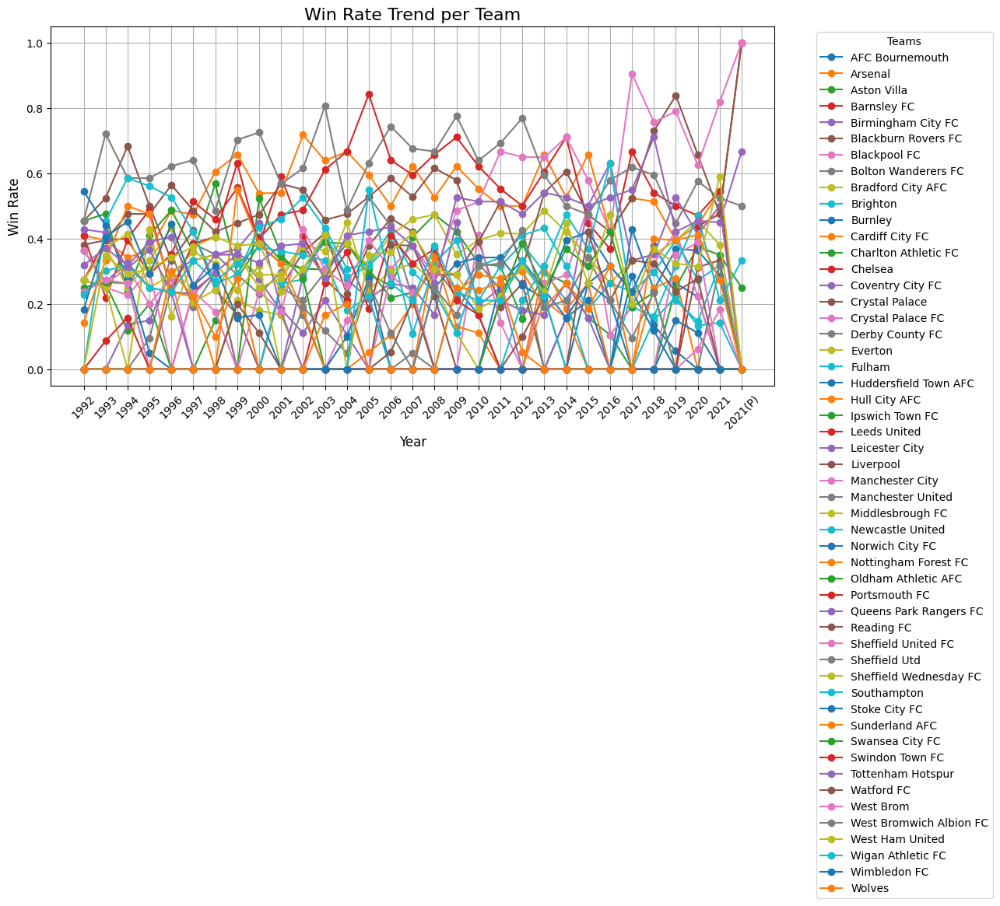

In [ ]:
# 折れ線グラフの描画
plt.figure(figsize=(12, 6))

# 各チームの勝率の折れ線グラフを描く
for team in win_rate_trend.columns:
    plt.plot(win_rate_trend.index, win_rate_trend[team], marker='o', label=team)

# グラフの設定
plt.title('Win Rate Trend per Team', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Win Rate', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Teams', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()

# グラフを表示
plt.show()


<ipython-input-13-213fa3f8d45c>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


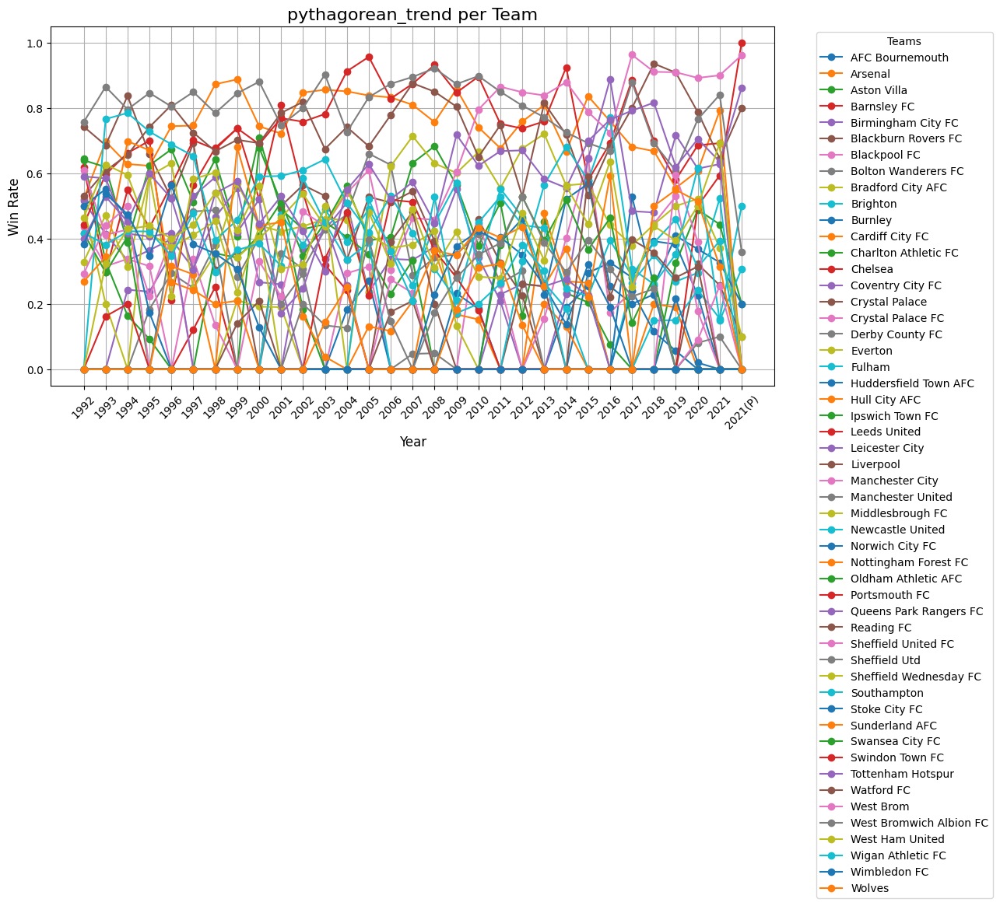

In [ ]:
# 折れ線グラフの描画
plt.figure(figsize=(12, 6))

# 各チームの勝率の折れ線グラフを描く
for team in pythagorean_trend.columns:
    plt.plot(pythagorean_trend.index, pythagorean_trend[team], marker='o', label=team)

# グラフの設定
plt.title('pythagorean_trend per Team', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Win Rate', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Teams', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()

# グラフを表示
plt.show()


現在のプレミアリーグのチームだけなら観察可能??

In [ ]:
currently_being_used = [
    "AFC Bournemouth",
    "Arsenal",
    "Aston Villa",
    "Brighton",
    "Burnley",
    "Chelsea",
    "Crystal Palace",
    "Everton",
    "Fulham",
    "Liverpool",
    "Manchester City",
    "Manchester United",
    "Newcastle United",
    "Nottingham Forest FC",
    "Tottenham Hotspur",
    "West Ham United",
    "Wolverhampton Wanderers (Wolves)"
]


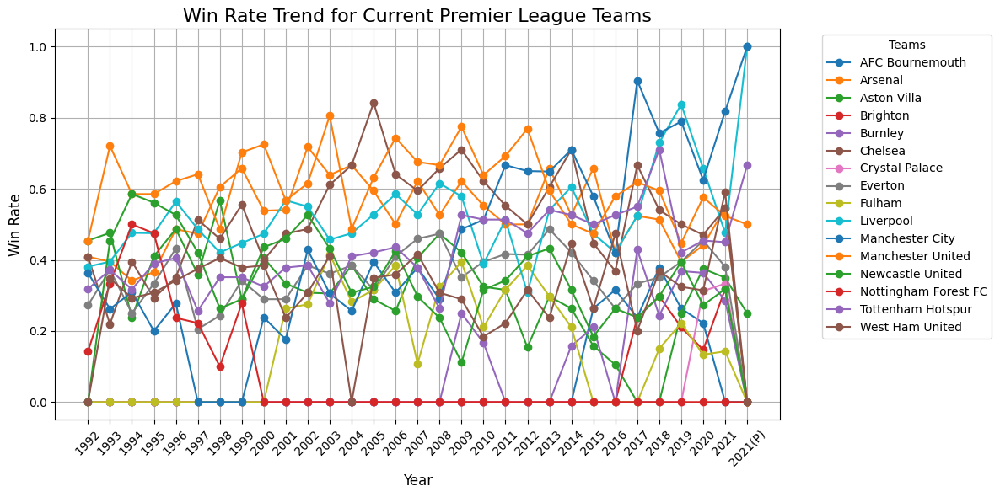

In [ ]:
# 折れ線グラフの描画
plt.figure(figsize=(12, 6))

# 現在のプレミアリーグチームの勝率だけを描画
for team in currently_being_used:
    if team in win_rate_trend.columns:  # チームが列に存在するか確認
        plt.plot(win_rate_trend.index, win_rate_trend[team], marker='o', label=team)

# グラフの設定
plt.title('Win Rate Trend for Current Premier League Teams', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Win Rate', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Teams', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()

# グラフを表示
plt.show()

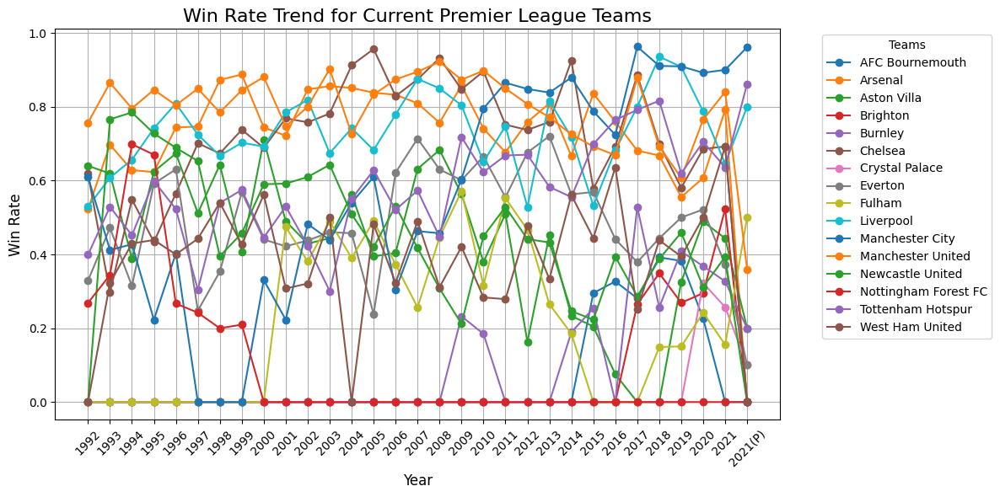

In [ ]:
# 折れ線グラフの描画
plt.figure(figsize=(12, 6))

# 現在のプレミアリーグチームのピタゴラス勝率だけを描画
for team in currently_being_used:
    if team in pythagorean_trend.columns:  # チームが列に存在するか確認
        plt.plot(pythagorean_trend.index, pythagorean_trend[team], marker='o', label=team)

# グラフの設定
plt.title('Win Rate Trend for Current Premier League Teams', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Win Rate', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Teams', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid()
plt.tight_layout()

# グラフを表示
plt.show()

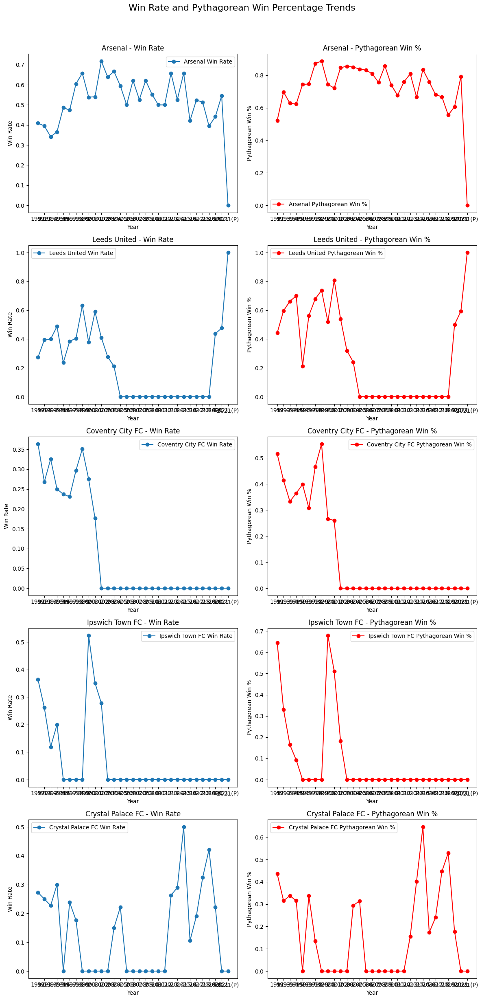

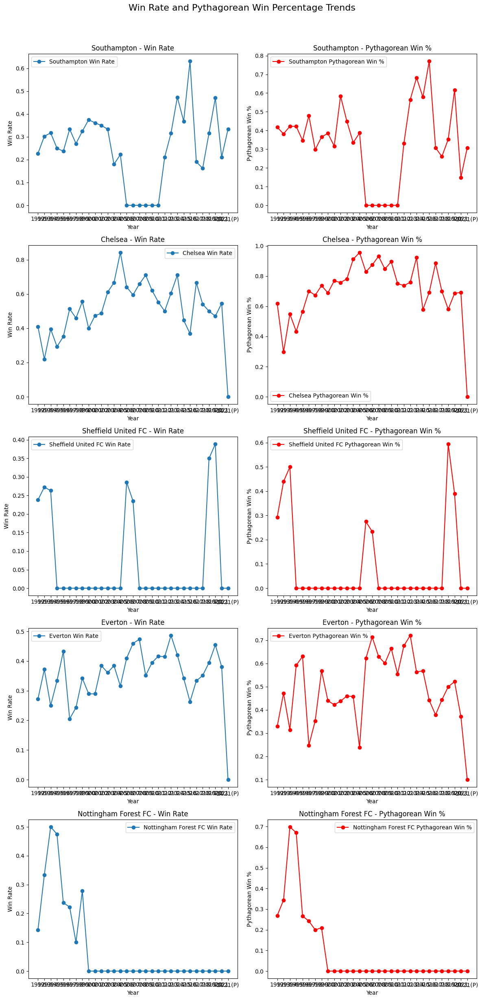

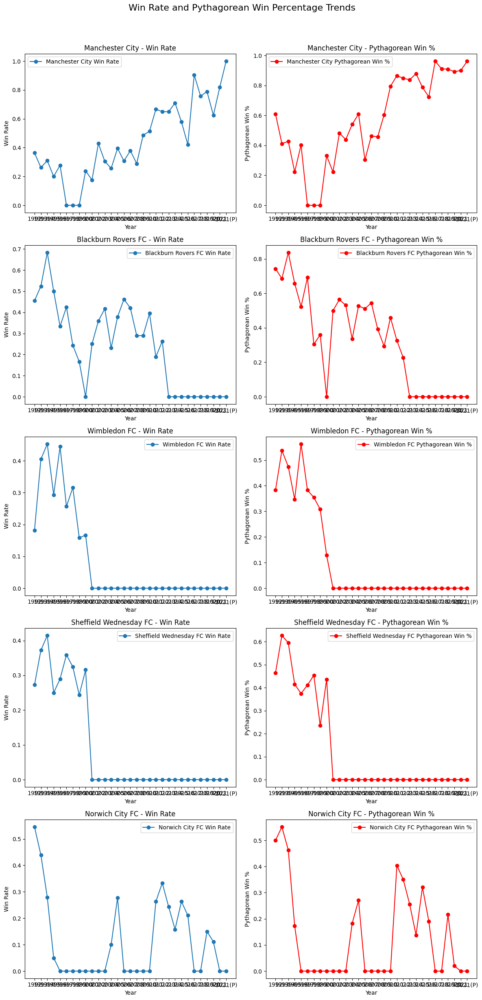

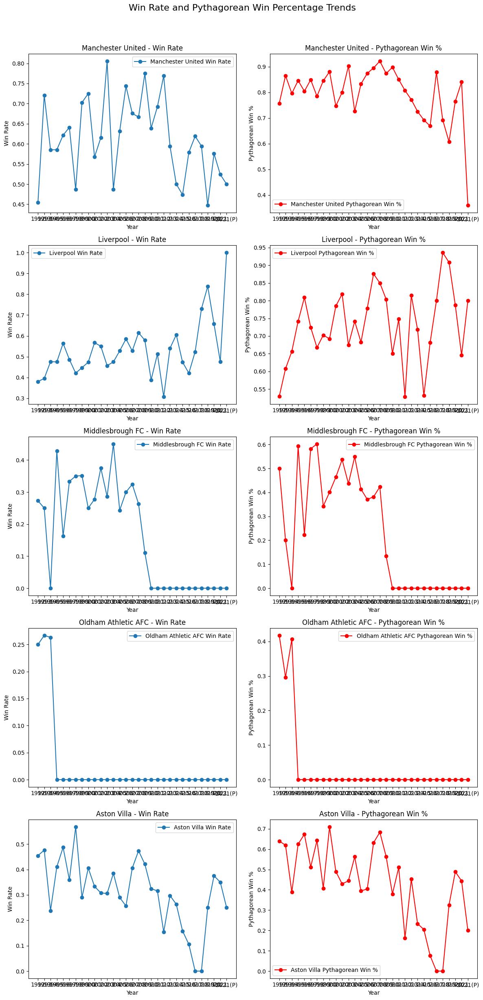

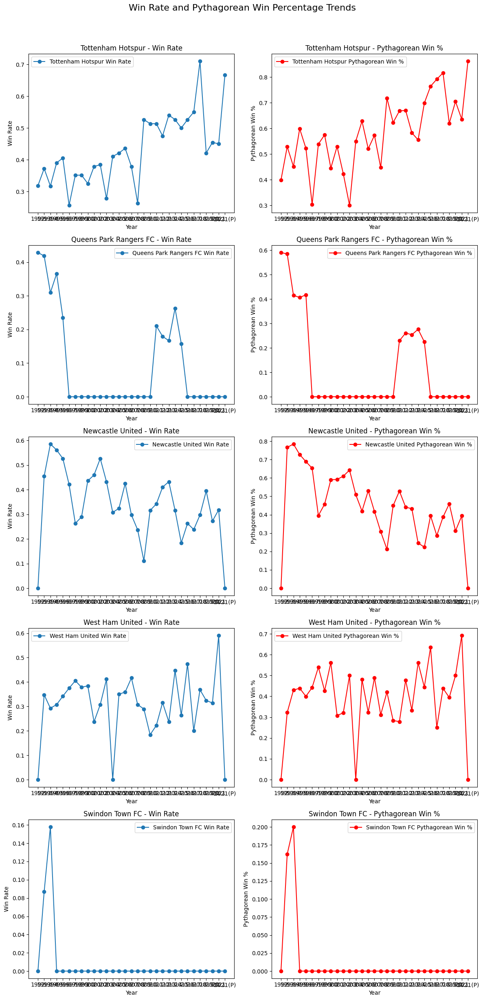

...

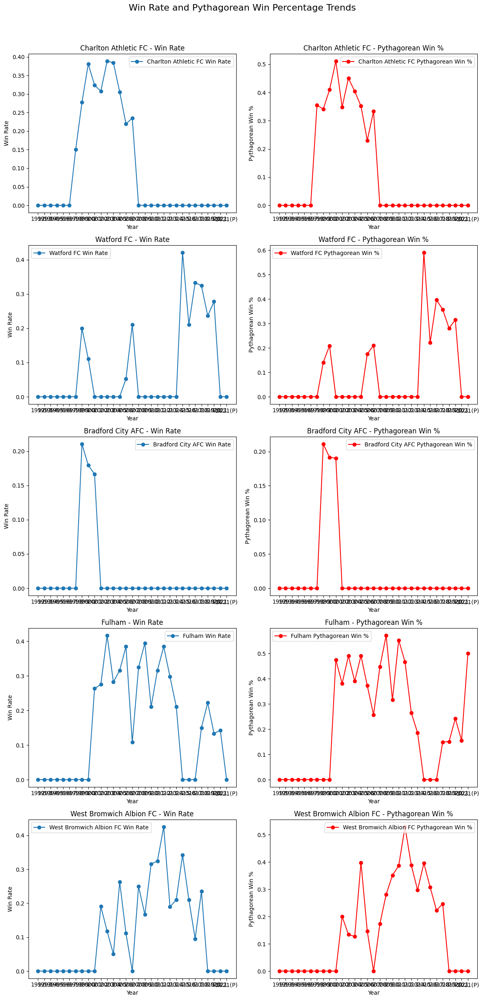

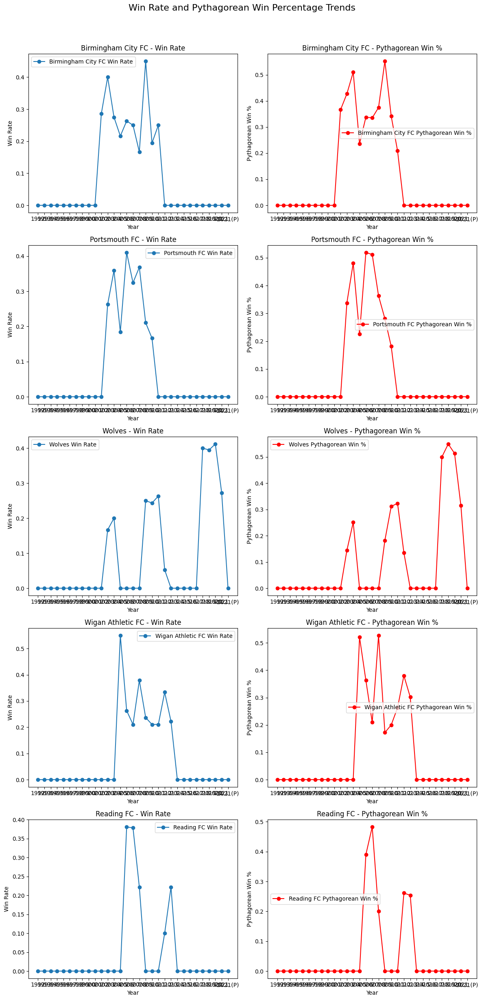

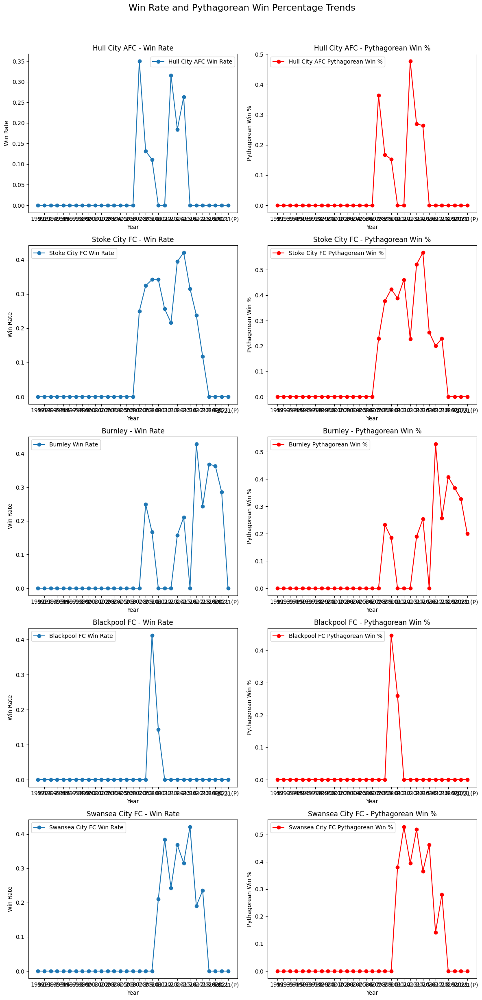

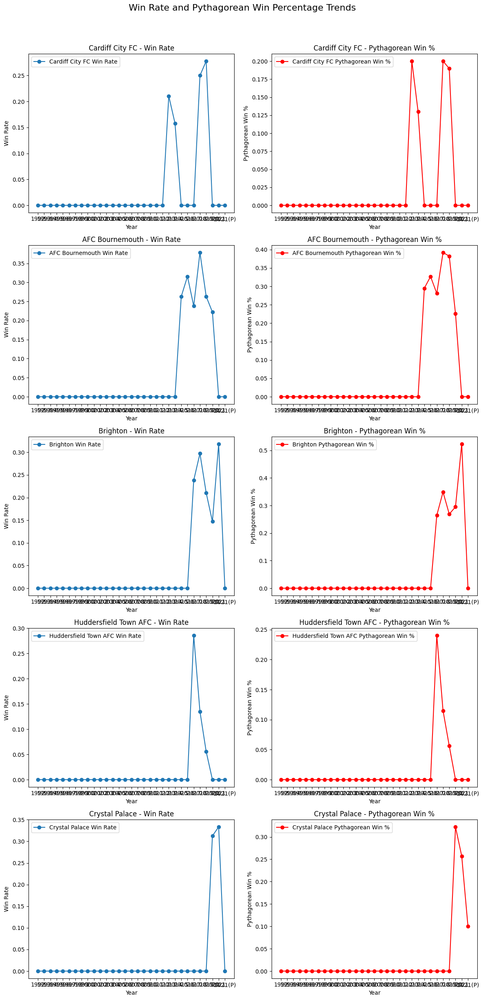

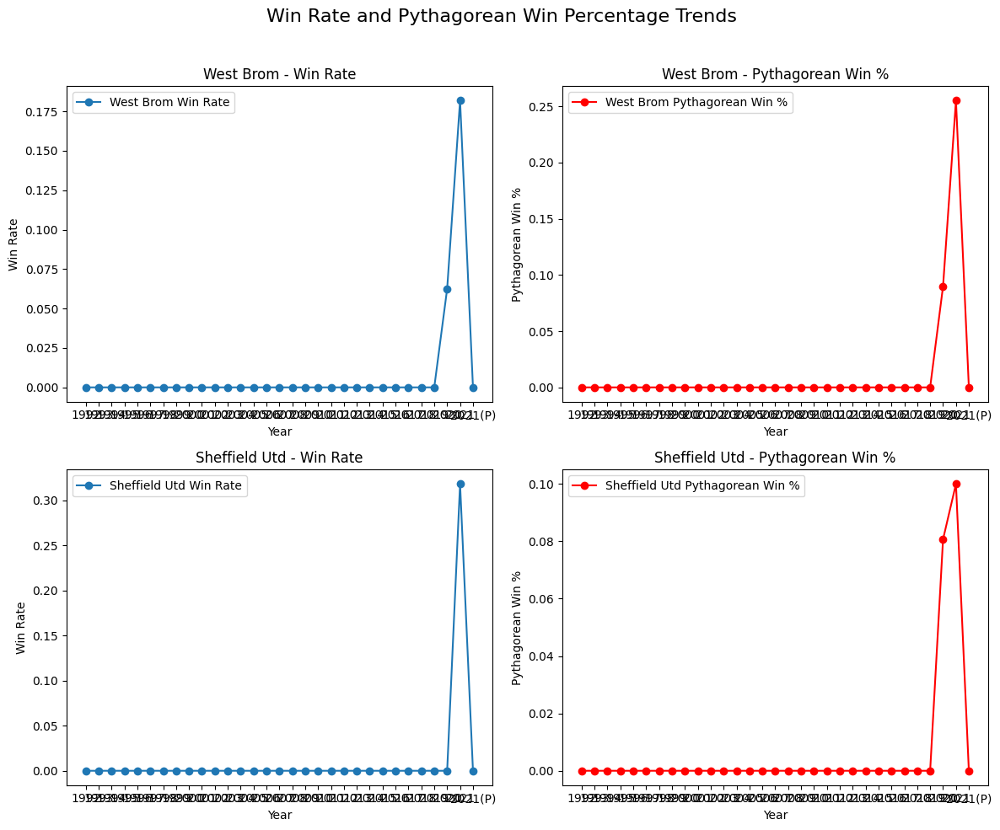

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# チームを5つずつのグループに分割
teams = seasonal_stats_df['Team'].unique()
team_groups = [teams[i:i + 5] for i in range(0, len(teams), 5)]

# プロット関数の定義
def plot_team_stats_grid(group, win_rate_trend, pythagorean_trend):
    fig, axes = plt.subplots(len(group), 2, figsize=(12, 5 * len(group)))  # 各行に1チームずつ
    fig.suptitle("Win Rate and Pythagorean Win Percentage Trends", fontsize=16)

    # 各チームごとのプロット
    for i, team in enumerate(group):
        # 勝率プロット
        axes[i, 0].plot(win_rate_trend.index, win_rate_trend[team], marker='o', label=f"{team} Win Rate")
        axes[i, 0].set_title(f"{team} - Win Rate")
        axes[i, 0].set_xlabel("Year")
        axes[i, 0].set_ylabel("Win Rate")
        axes[i, 0].legend()

        # ピタゴラス勝率プロット
        axes[i, 1].plot(pythagorean_trend.index, pythagorean_trend[team], marker='o', color='r', label=f"{team} Pythagorean Win %")
        axes[i, 1].set_title(f"{team} - Pythagorean Win %")
        axes[i, 1].set_xlabel("Year")
        axes[i, 1].set_ylabel("Pythagorean Win %")
        axes[i, 1].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# 各グループごとにグリッド表示
for group in team_groups:
    plot_team_stats_grid(group, win_rate_trend, pythagorean_trend)


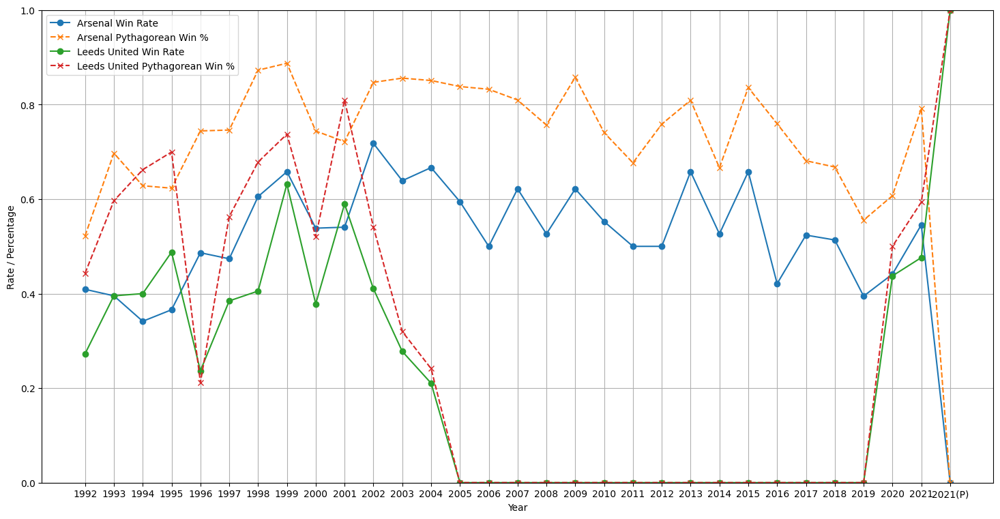

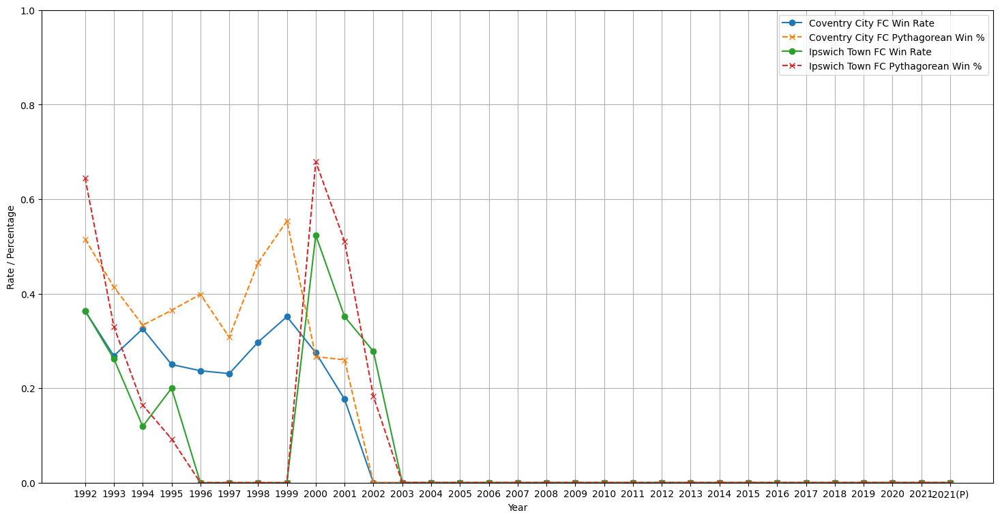

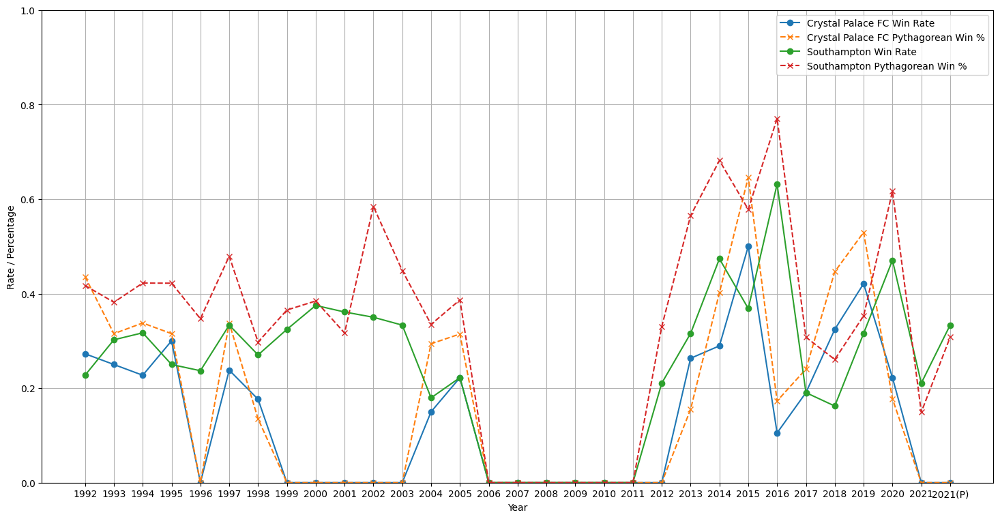

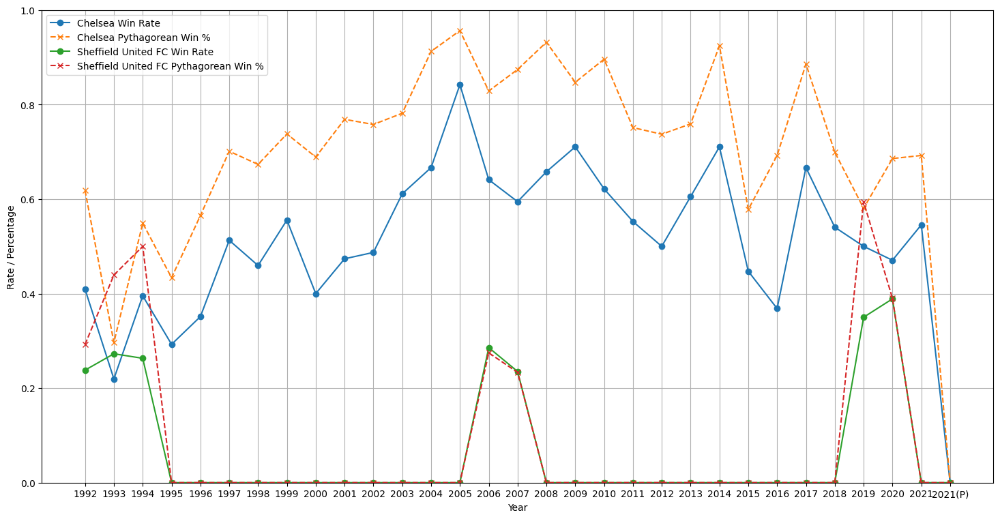

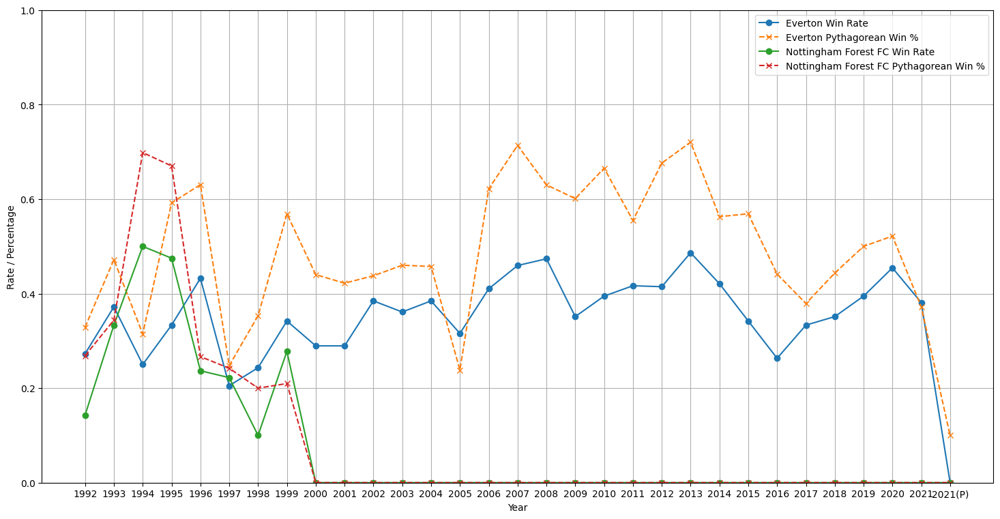

...

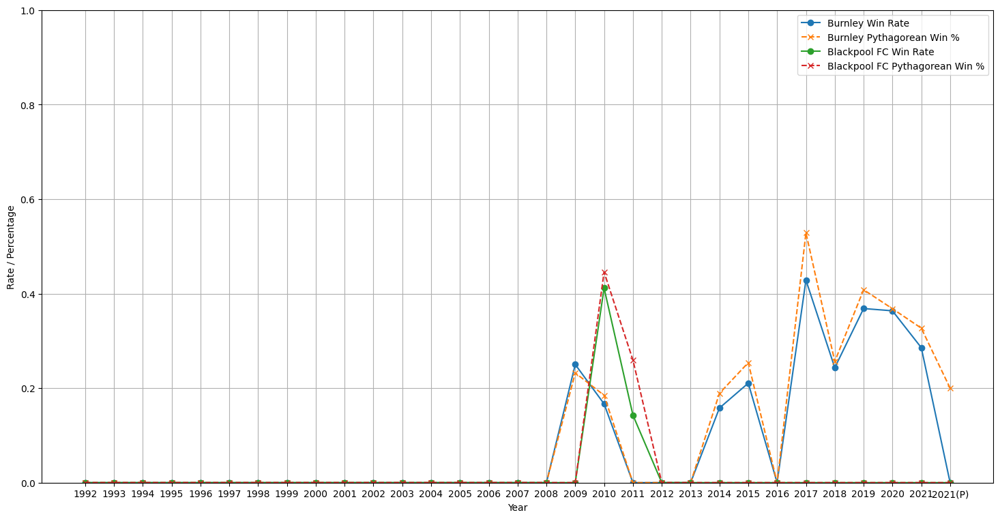

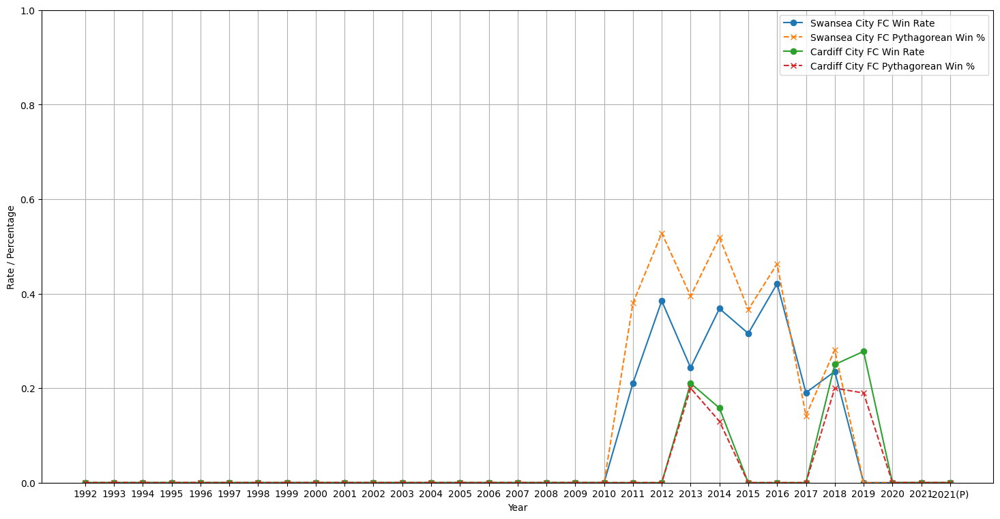

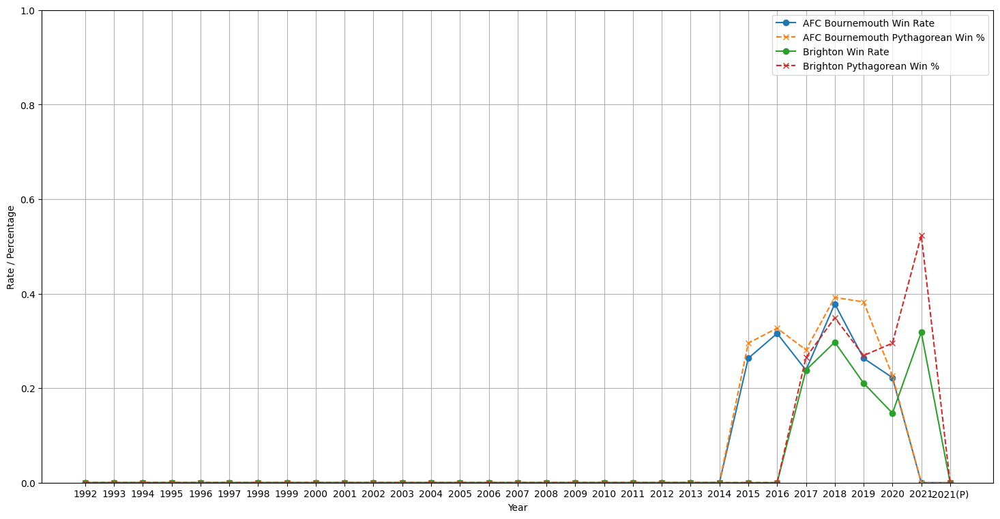

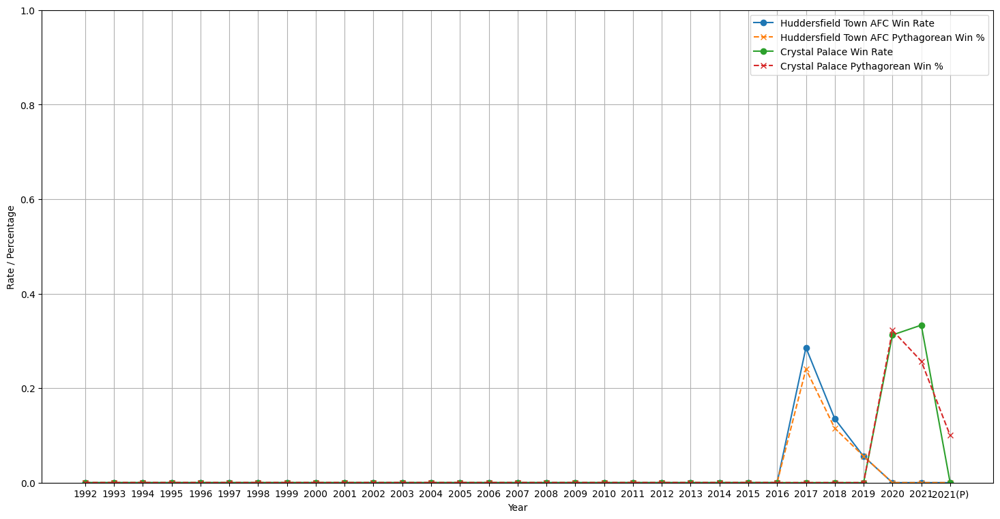

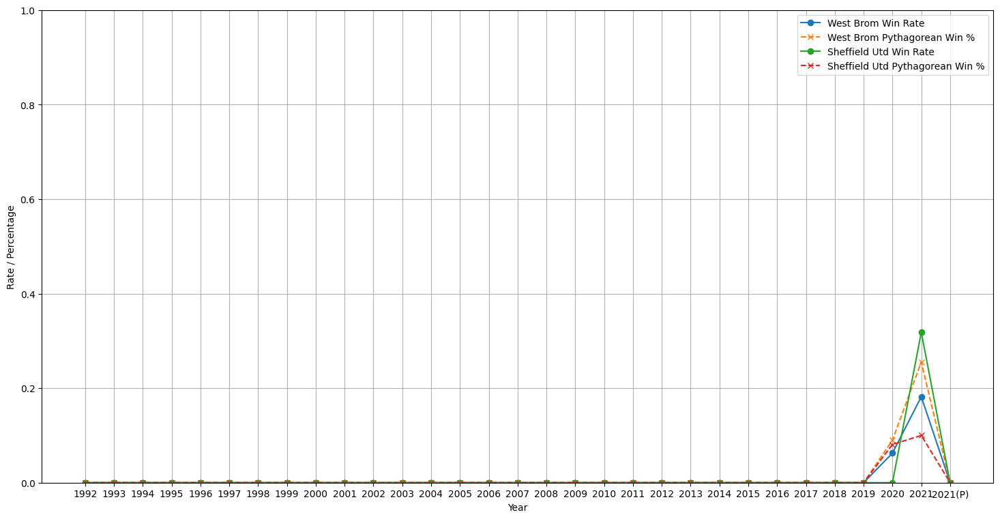

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# チームを5つずつのグループに分割
teams = seasonal_stats_df['Team'].unique()
team_groups = [teams[i:i + 2] for i in range(0, len(teams), 2)]

# 勝率とピタゴラス勝率を1つのグラフに描画する関数
def plot_win_and_pythagorean_for_group(group, win_rate_trend, pythagorean_trend):
    plt.figure(figsize=(18, 9))  # グラフのサイズ設定

    for team in group:
        # 勝率のプロット
        plt.plot(win_rate_trend.index, win_rate_trend[team], marker='o', linestyle='-', label=f"{team} Win Rate")
        # ピタゴラス勝率のプロット
        plt.plot(pythagorean_trend.index, pythagorean_trend[team], marker='x', linestyle='--', label=f"{team} Pythagorean Win %")


    plt.ylim(0, 1)
    plt.xlabel("Year")
    plt.ylabel("Rate / Percentage")
    plt.legend(loc='best')  # 凡例を最適な位置に配置
    plt.grid(True)
    plt.show()

# 各チームグループごとにグラフを作成
for group in team_groups:
    plot_win_and_pythagorean_for_group(group, win_rate_trend, pythagorean_trend)


In [24]:
win_rate_trend["Manchester City"].describe()

,Manchester City
count,31.000000
mean,0.443792
std,0.264299
min,0.000000
25%,0.269841
50%,0.394737
75%,0.649324
max,1.000000


In [33]:
# ビッグ6のチームリスト
big6 = [
    "Manchester United", "Liverpool", "Chelsea",
    "Arsenal", "Manchester City", "Tottenham Hotspur"
]

# ビッグ6のチームだけを抽出
win_rate_trend_big6 = win_rate_trend[big6]
pythagorean_trend_big6 = pythagorean_trend[big6]

# 表示
print("Win Rate Trend (Big 6):")
win_rate_trend_big6

Win Rate Trend (Big 6):


Team,Manchester United,Liverpool,Chelsea,Arsenal,Manchester City,Tottenham Hotspur
Year,,,,,,
1992,0.454545,0.380952,0.409091,0.409091,0.363636,0.318182
1993,0.720930,0.395349,0.219512,0.395349,0.261905,0.372093
1994,0.585366,0.476190,0.395349,0.341463,0.309524,0.317073
1995,0.585366,0.475000,0.292683,0.365854,0.200000,0.390244
1996,0.621622,0.564103,0.351351,0.486486,0.277778,0.405405
1997,0.641026,0.486486,0.512821,0.473684,0.000000,0.256410
1998,0.486486,0.421053,0.459459,0.605263,0.000000,0.351351
1999,0.702703,0.447368,0.555556,0.657895,0.000000,0.351351
2000,0.725000,0.473684,0.400000,0.538462,0.238095,0.325000


In [46]:
print("\nPythagorean Win Percentage (Big 6):")
pythagorean_trend_big6.sort_index(ascending=False)


Pythagorean Win Percentage (Big 6):


Team,Manchester United,Liverpool,Chelsea,Arsenal,Manchester City,Tottenham Hotspur
Year,,,,,,
2021(P),0.360000,0.800000,0.000000,0.000000,0.961538,0.862069
2021,0.840331,0.645704,0.692308,0.791775,0.900000,0.635857
2020,0.765260,0.787154,0.685765,0.607174,0.892074,0.704878
2019,0.607634,0.908068,0.580552,0.555385,0.909320,0.619728
2018,0.692308,0.935809,0.699305,0.667911,0.910704,0.816316
2017,0.878385,0.800000,0.885847,0.681132,0.962743,0.791775
2016,0.668807,0.681947,0.692308,0.759644,0.723857,0.764151
2015,0.692308,0.532225,0.577952,0.836035,0.787806,0.698677
2014,0.725322,0.718128,0.924528,0.666299,0.879134,0.555385


In [36]:
win_rate_trend_big6.describe()

Team,Manchester United,Liverpool,Chelsea,Arsenal,Manchester City,Tottenham Hotspur
count,31.000000,31.000000,31.000000,31.000000,31.000000,31.000000
mean,0.612886,0.531607,0.509990,0.514072,0.443792,0.432611
std,0.099353,0.136518,0.163938,0.136250,0.264299,0.108647
min,0.447368,0.307692,0.000000,0.000000,0.000000,0.256410
25%,0.545689,0.465414,0.428230,0.457430,0.269841,0.361722
50%,0.615385,0.512821,0.512821,0.526316,0.394737,0.421053
75%,0.683992,0.573257,0.616366,0.613442,0.649324,0.513514
max,0.805556,1.000000,0.842105,0.717949,1.000000,0.710526


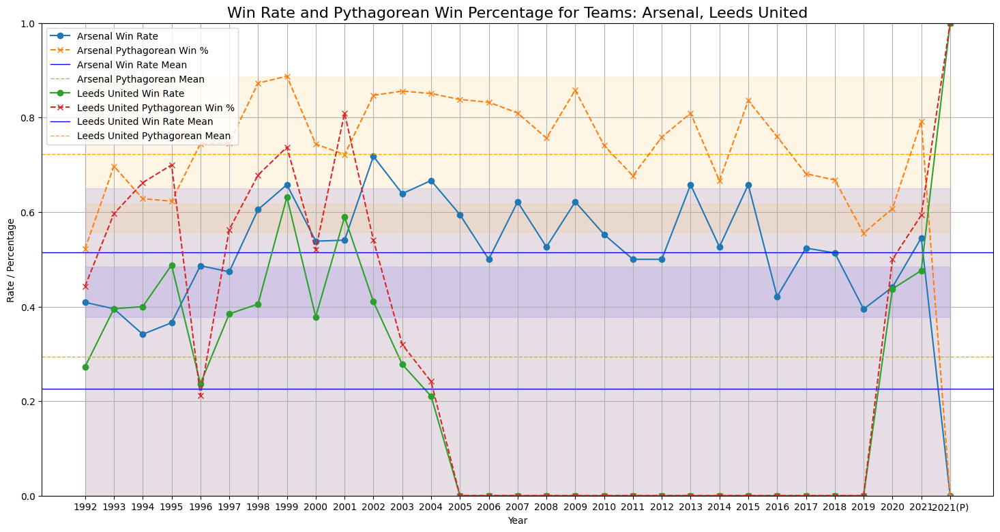

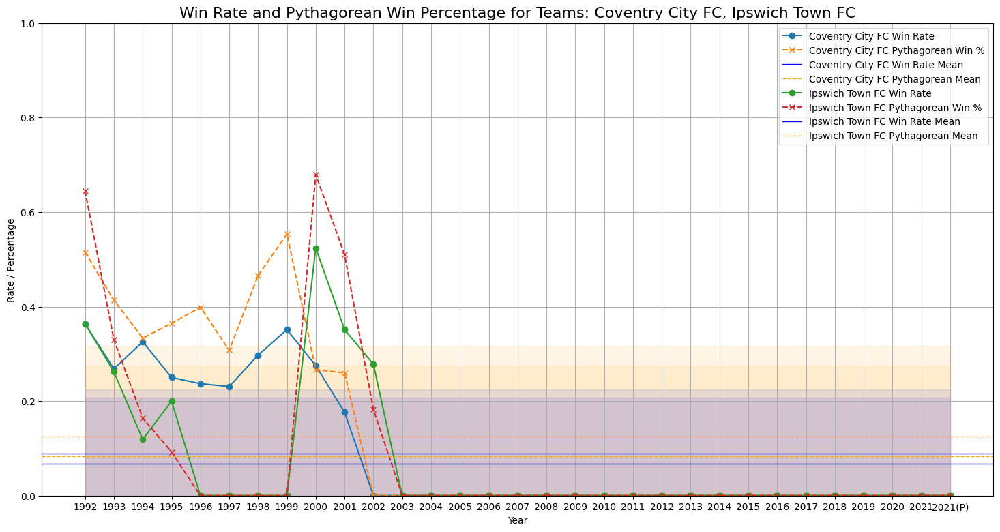

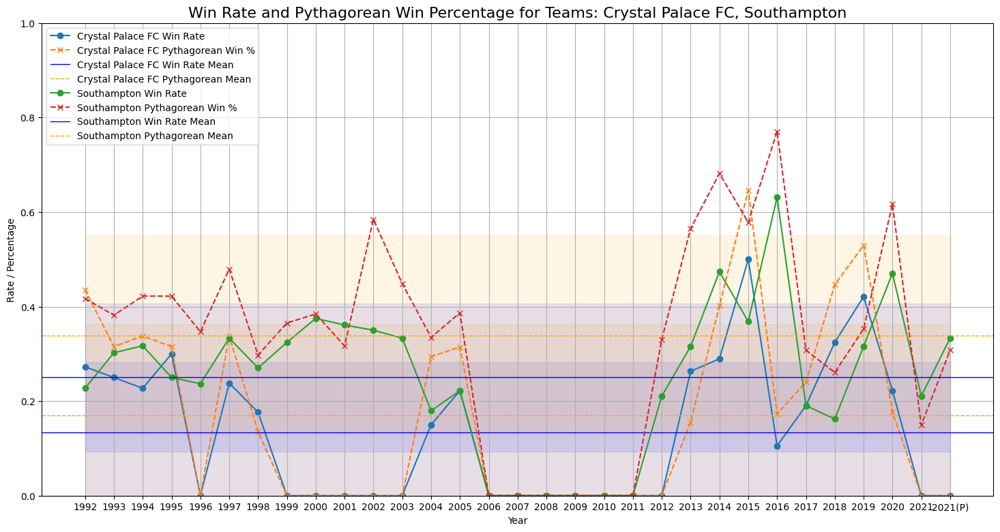

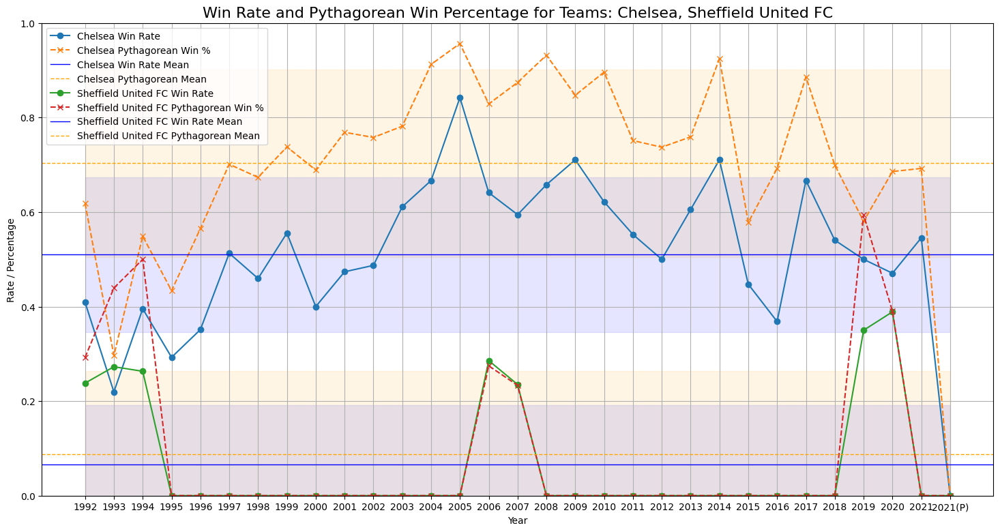

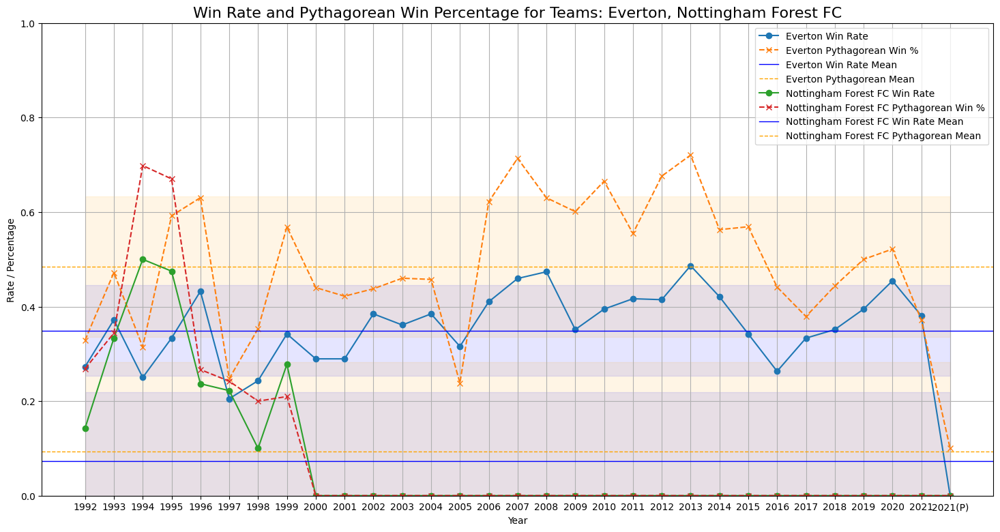

...

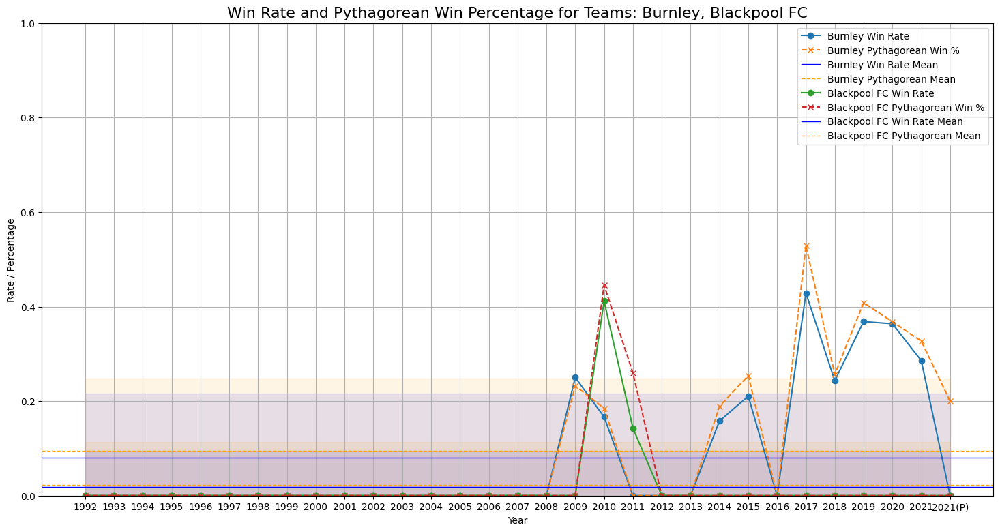

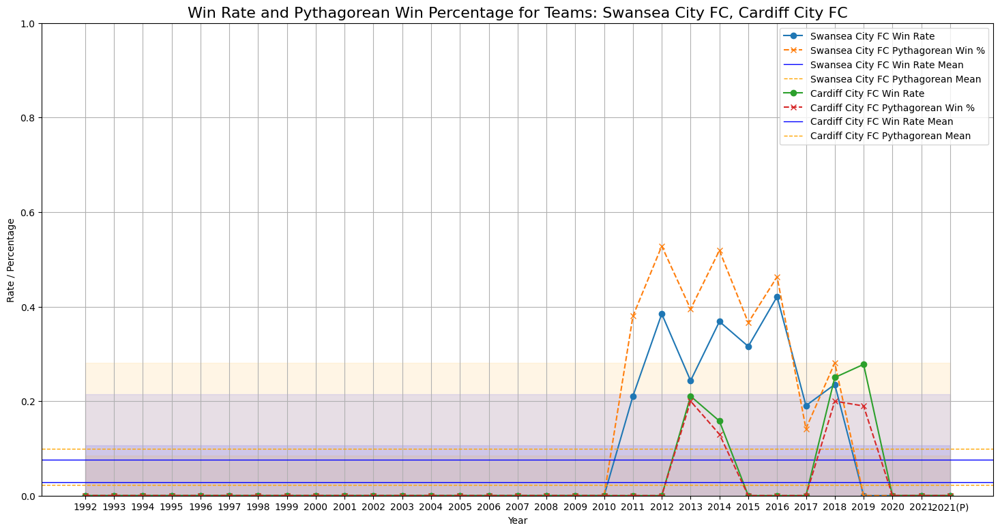

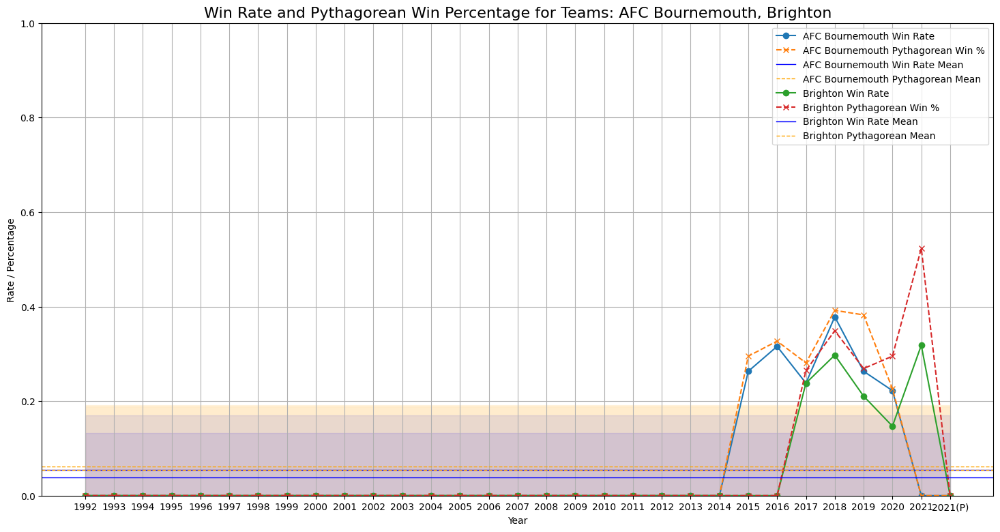

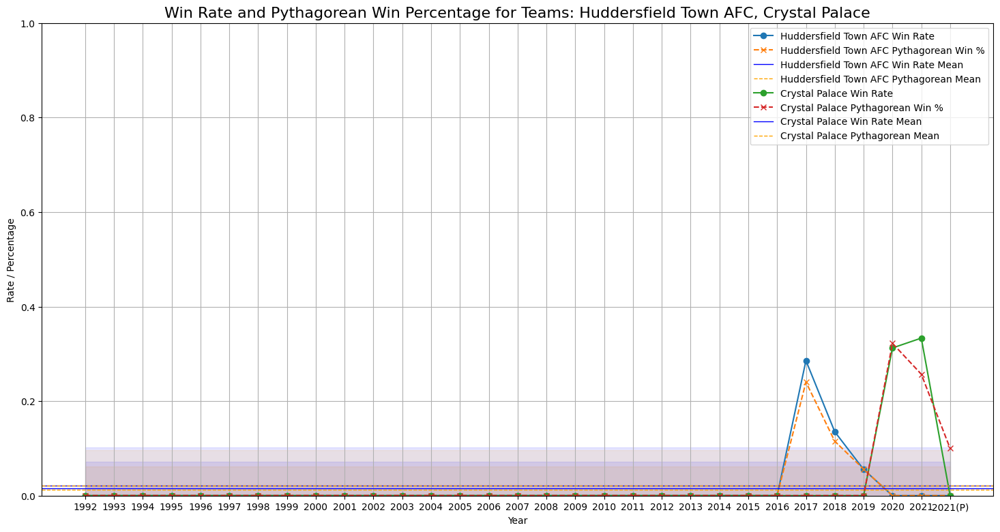

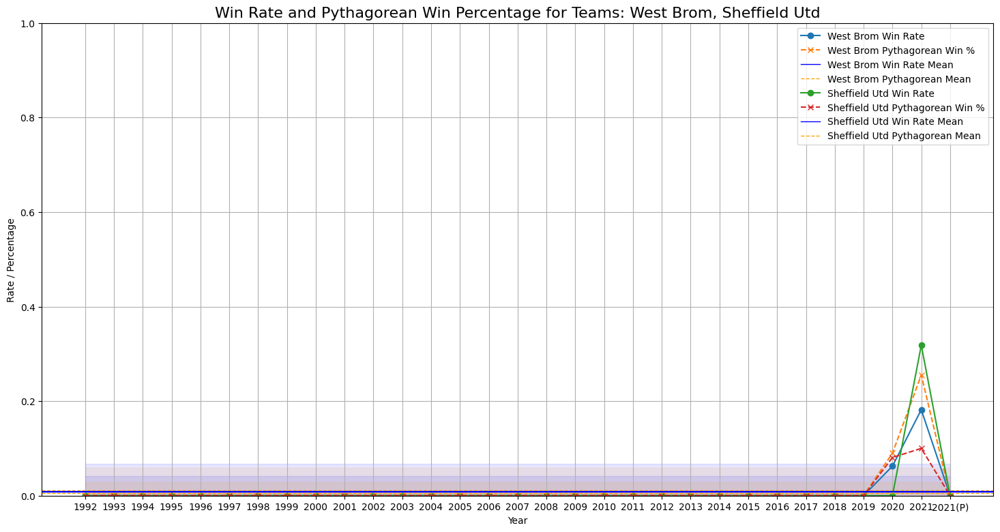

In [47]:
import matplotlib.pyplot as plt
import pandas as pd

# チームを2つずつのグループに分割
teams = seasonal_stats_df['Team'].unique()
team_groups = [teams[i:i + 2] for i in range(0, len(teams), 2)]

# 勝率とピタゴラス勝率を1つのグラフに描画する関数
def plot_win_and_pythagorean_for_group(group, win_rate_trend, pythagorean_trend):
    plt.figure(figsize=(18, 9))  # グラフのサイズ設定

    for team in group:
        # 勝率のプロット
        plt.plot(win_rate_trend.index, win_rate_trend[team], marker='o', linestyle='-', label=f"{team} Win Rate")
        # ピタゴラス勝率のプロット
        plt.plot(pythagorean_trend.index, pythagorean_trend[team], marker='x', linestyle='--', label=f"{team} Pythagorean Win %")

        # 平均値の計算とプロット
        win_rate_mean = win_rate_trend[team].mean()
        pythagorean_mean = pythagorean_trend[team].mean()
        plt.axhline(y=win_rate_mean, color='blue', linestyle='-', linewidth=1, label=f"{team} Win Rate Mean")
        plt.axhline(y=pythagorean_mean, color='orange', linestyle='--', linewidth=1, label=f"{team} Pythagorean Mean")

        # 分散の計算とプロット
        win_rate_std = win_rate_trend[team].std()
        pythagorean_std = pythagorean_trend[team].std()

        plt.fill_between(win_rate_trend.index,
                         win_rate_mean - win_rate_std,
                         win_rate_mean + win_rate_std,
                         color='blue', alpha=0.1)  # 勝率の分散

        plt.fill_between(pythagorean_trend.index,
                         pythagorean_mean - pythagorean_std,
                         pythagorean_mean + pythagorean_std,
                         color='orange', alpha=0.1)  # ピタゴラス勝率の分散

    plt.ylim(0, 1)
    plt.xlabel("Year")
    plt.ylabel("Rate / Percentage")
    plt.title(f'Win Rate and Pythagorean Win Percentage for Teams: {", ".join(group)}', fontsize=16)
    plt.legend(loc='best')  # 凡例を最適な位置に配置
    plt.grid(True)
    plt.show()

# 各チームグループごとにグラフを作成
for group in team_groups:
    plot_win_and_pythagorean_for_group(group, win_rate_trend, pythagorean_trend)


In [74]:
print("\n勝率の推移top5:")
print(win_rate_trend["Manchester City"].sort_values(ascending=False).head())
print(win_rate_trend["Liverpool"].sort_values(ascending=False).head())
print(win_rate_trend['Arsenal'].sort_values(ascending=False).head())
print(win_rate_trend['Chelsea'].sort_values(ascending=False).head())
print(win_rate_trend['Tottenham Hotspur'].sort_values(ascending=False).head())
print(win_rate_trend['Manchester United'].sort_values(ascending=False).head())


勝率の推移top5:
Year
2021(P)    1.000000
2017       0.904762
2021       0.818182
2019       0.789474
2018       0.756757
Name: Manchester City, dtype: float64
Year
2021(P)    1.000000
2019       0.837838
2018       0.729730
2020       0.657143
2008       0.615385
Name: Liverpool, dtype: float64
Year
2002    0.717949
2004    0.666667
1999    0.657895
2015    0.657895
2013    0.657895
Name: Arsenal, dtype: float64
Year
2005    0.842105
2014    0.710526
2009    0.710526
2004    0.666667
2017    0.666667
Name: Chelsea, dtype: float64
Year
2018       0.710526
2021(P)    0.666667
2017       0.550000
2013       0.540541
2009       0.526316
Name: Tottenham Hotspur, dtype: float64
Year
2003    0.805556
2009    0.775000
2012    0.769231
2006    0.743590
2000    0.725000
Name: Manchester United, dtype: float64


In [75]:
print("\nピタゴラス勝率の推移top5:")
print(pythagorean_trend["Manchester City"].sort_values(ascending=False).head())
print(pythagorean_trend["Liverpool"].sort_values(ascending=False).head())
print(pythagorean_trend['Arsenal'].sort_values(ascending=False).head())
print(pythagorean_trend['Chelsea'].sort_values(ascending=False).head())
print(pythagorean_trend['Tottenham Hotspur'].sort_values(ascending=False).head())
print(pythagorean_trend['Manchester United'].sort_values(ascending=False).head())




ピタゴラス勝率の推移top5:
Year
2017       0.962743
2021(P)    0.961538
2018       0.910704
2019       0.909320
2021       0.900000
Name: Manchester City, dtype: float64
Year
2018    0.935809
2019    0.908068
2007    0.875529
2008    0.849875
2002    0.818697
Name: Liverpool, dtype: float64
Year
1999    0.887427
1998    0.872764
2009    0.857905
2003    0.855937
2004    0.850897
Name: Arsenal, dtype: float64
Year
2005    0.956470
2008    0.931926
2014    0.924528
2004    0.912398
2010    0.896018
Name: Chelsea, dtype: float64
Year
2021(P)    0.862069
2018       0.816316
2017       0.791775
2016       0.764151
2009       0.717895
Name: Tottenham Hotspur, dtype: float64
Year
2008    0.921600
2003    0.902270
2010    0.897742
2007    0.895029
2000    0.880488
Name: Manchester United, dtype: float64


In [76]:
print("\n勝率の推移low5:")
print(win_rate_trend["Manchester City"].sort_values(ascending=True).head())
print(win_rate_trend["Liverpool"].sort_values(ascending=True).head())
print(win_rate_trend['Arsenal'].sort_values(ascending=True).head())
print(win_rate_trend['Chelsea'].sort_values(ascending=True).head())
print(win_rate_trend['Tottenham Hotspur'].sort_values(ascending=True).head())
print(win_rate_trend['Manchester United'].sort_values(ascending=True).head())


勝率の推移low5:
Year
1997    0.000000
1998    0.000000
1999    0.000000
2001    0.176471
1995    0.200000
Name: Manchester City, dtype: float64
Year
2012    0.307692
1992    0.380952
2010    0.388889
1993    0.395349
1998    0.421053
Name: Liverpool, dtype: float64
Year
2021(P)    0.000000
1994       0.341463
1995       0.365854
2019       0.394737
1993       0.395349
Name: Arsenal, dtype: float64
Year
2021(P)    0.000000
1993       0.219512
1995       0.292683
1996       0.351351
2016       0.368421
Name: Chelsea, dtype: float64
Year
1997    0.256410
2008    0.263158
2003    0.277778
1994    0.317073
1992    0.318182
Name: Tottenham Hotspur, dtype: float64
Year
2019    0.447368
1992    0.454545
2015    0.473684
1998    0.486486
2004    0.487179
Name: Manchester United, dtype: float64


In [77]:
print("\nピタゴラス勝率の推移low5:")
print(pythagorean_trend["Manchester City"].sort_values(ascending=True).head())
print(pythagorean_trend["Liverpool"].sort_values(ascending=True).head())
print(pythagorean_trend['Arsenal'].sort_values(ascending=True).head())
print(pythagorean_trend['Chelsea'].sort_values(ascending=True).head())
print(pythagorean_trend['Tottenham Hotspur'].sort_values(ascending=True).head())
print(pythagorean_trend['Manchester United'].sort_values(ascending=True).head())


ピタゴラス勝率の推移low5:
Year
1997    0.000000
1998    0.000000
1999    0.000000
1995    0.222993
2001    0.222993
Name: Manchester City, dtype: float64
Year
2012    0.528548
1992    0.529386
2015    0.532225
1993    0.607808
2021    0.645704
Name: Liverpool, dtype: float64
Year
2021(P)    0.000000
1992       0.522211
2019       0.555385
2020       0.607174
1995       0.623077
Name: Arsenal, dtype: float64
Year
2021(P)    0.000000
1993       0.296449
1995       0.433628
1994       0.549062
1996       0.565142
Name: Chelsea, dtype: float64
Year
2003    0.300695
1997    0.304253
1992    0.399011
2002    0.423529
2000    0.445616
Name: Tottenham Hotspur, dtype: float64
Year
2021(P)    0.360000
2019       0.607634
2016       0.668807
2018       0.692308
2015       0.692308
Name: Manchester United, dtype: float64


In [78]:
print(win_rate_trend_big6.describe())
print(pythagorean_trend_big6.describe())

Team   Manchester United  Liverpool    Chelsea    Arsenal  Manchester City  \
count          31.000000  31.000000  31.000000  31.000000        31.000000   
mean            0.612886   0.531607   0.509990   0.514072         0.443792   
std             0.099353   0.136518   0.163938   0.136250         0.264299   
min             0.447368   0.307692   0.000000   0.000000         0.000000   
25%             0.545689   0.465414   0.428230   0.457430         0.269841   
50%             0.615385   0.512821   0.512821   0.526316         0.394737   
75%             0.683992   0.573257   0.616366   0.613442         0.649324   
max             0.805556   1.000000   0.842105   0.717949         1.000000   

Team   Tottenham Hotspur  
count          31.000000  
mean            0.432611  
std             0.108647  
min             0.256410  
25%             0.361722  
50%             0.421053  
75%             0.513514  
max             0.710526  
Team   Manchester United  Liverpool    Chelsea    Arse